In [1]:
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
import colorcet as cc
import torchvision
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
# From the repository
from utils import load_imagenet_img, make_grayscale, make_black_white, show_mask_on_image, cut_image_with_mask, show_img
from vis import VanillaGradient, Deconvolution, GuidedBackprop, IntegratedGradients, visualize_imagenet, show_mask
from models import load_pretrained_model
import time
import warnings
warnings.filterwarnings('ignore')

# ImageNet可视化

Load  AlexNet_imagenet
Load  VGG11_imagenet
Load  ResNet18_imagenet


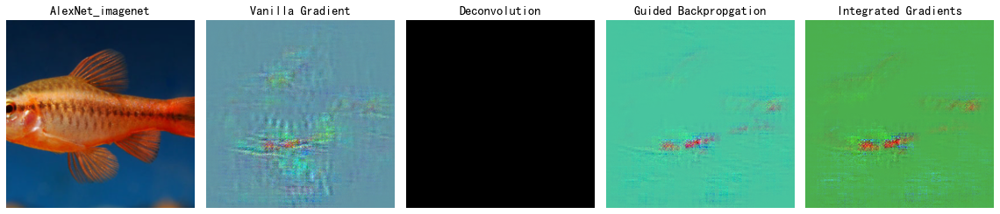

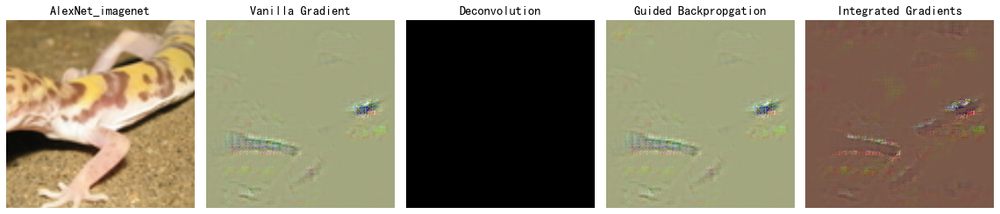

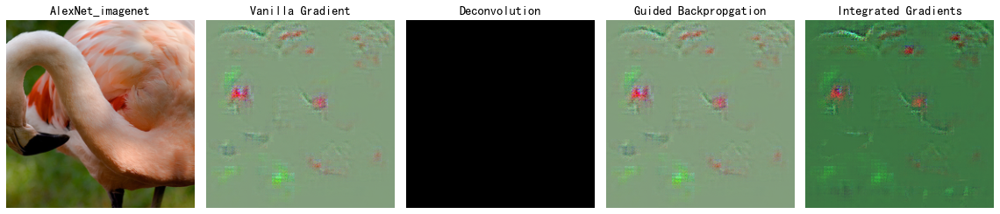

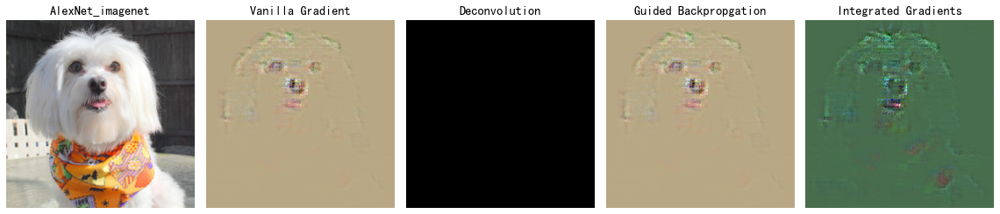

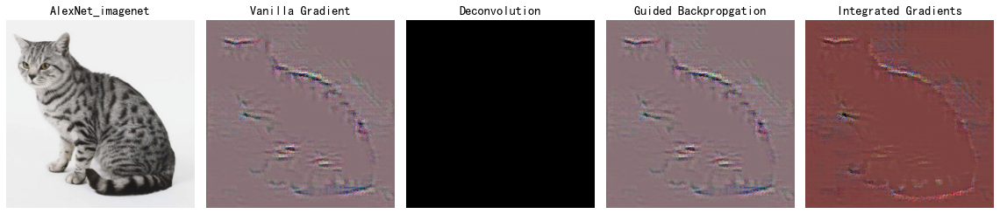

...

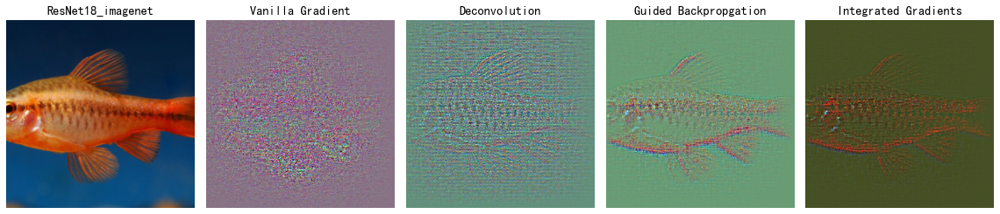

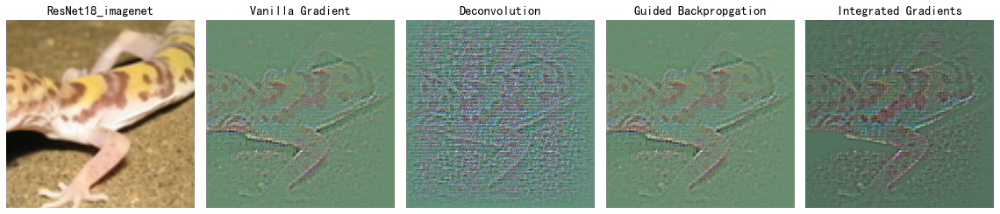

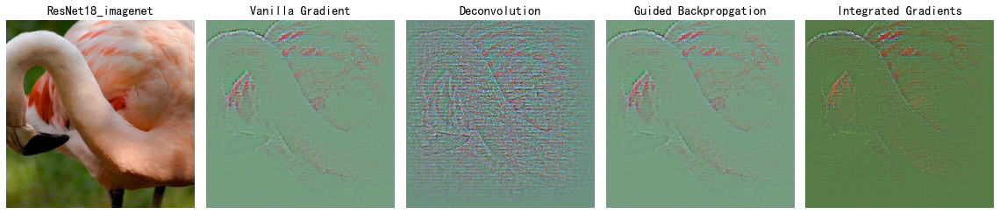

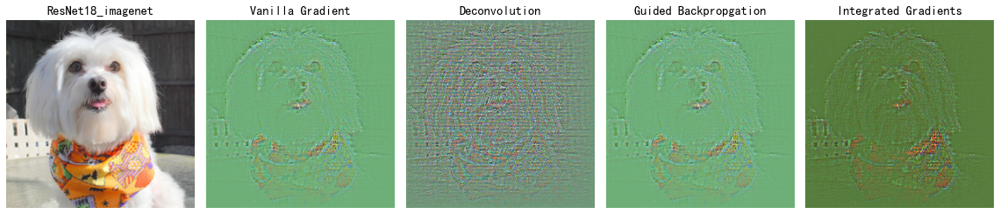

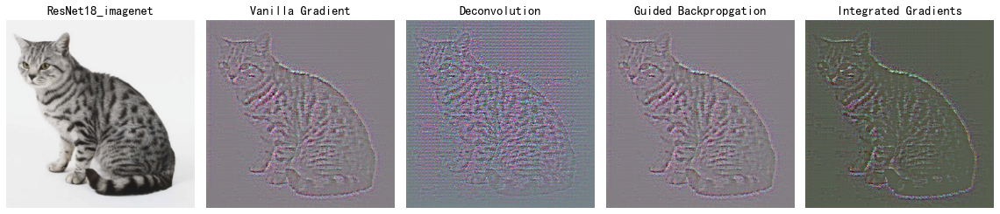

In [5]:
model_name_list = ['AlexNet_imagenet','VGG11_imagenet','ResNet18_imagenet']
for i in range(3):
    model = load_pretrained_model(model_name_list[i].lower())
    for j in range(5):
        img = load_imagenet_img('images/imagenet/'+str(j)+'.JPEG').cuda()
        visualize_imagenet(model, img, title=model_name_list[i], norm=True, clip=False, inv=True)
        torch.cuda.empty_cache()
        time.sleep(3)

# CIFAR-10可视化

In [6]:
train_data = torchvision.datasets.CIFAR10(
    root="./datasets",#路径
    train=True,#训练集
    download=False,#是否下载
    transform=transforms.ToTensor()#数据预处理
)
train_dataloader = DataLoader(train_data, batch_size=1, shuffle=False)
cifar_samples = {}
count = 0
for i, j in train_dataloader:
    if j not in cifar_samples.keys():
        cifar_samples[j.item()] = i
        count += 1
    if len(cifar_samples)==10:
        break

Load  AlexNet_cifar
Load  VGG11_cifar
Load  ResNet18_cifar


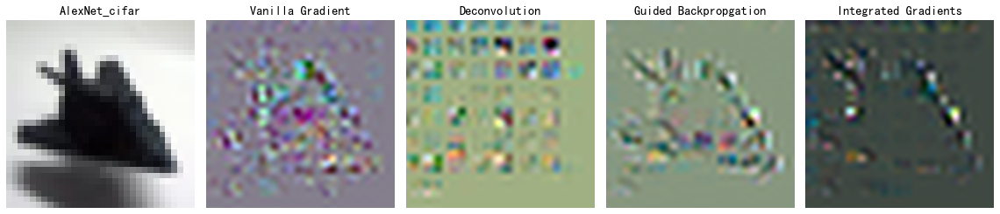

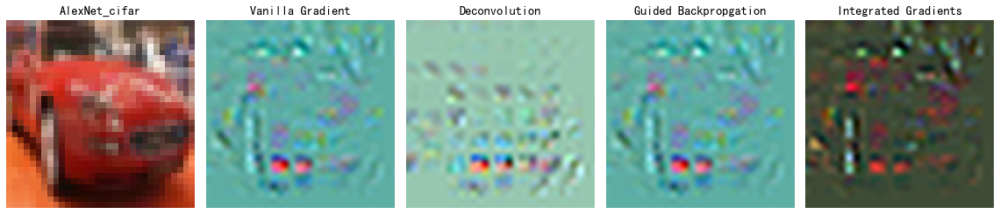

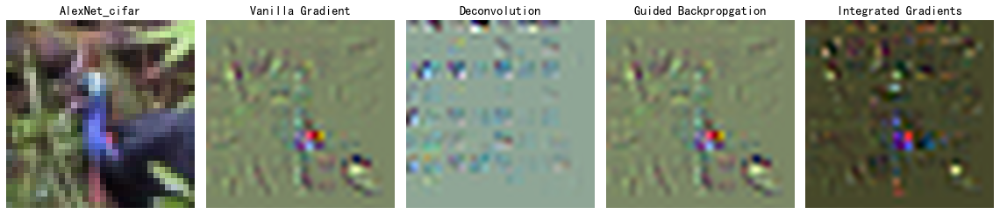

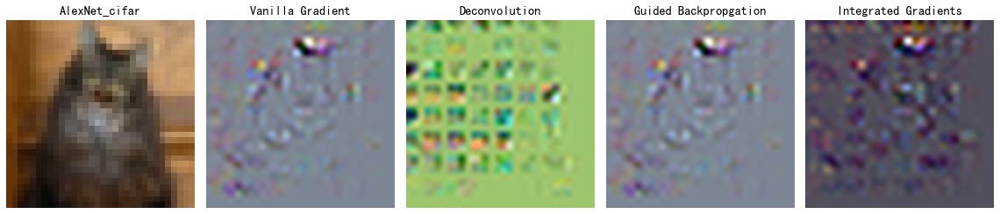

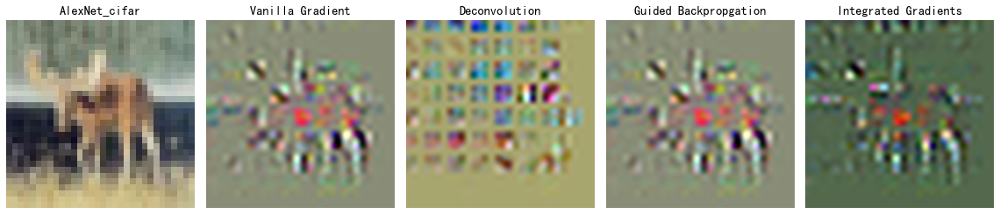

...

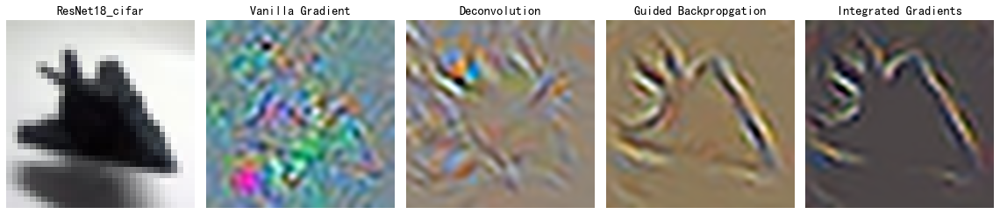

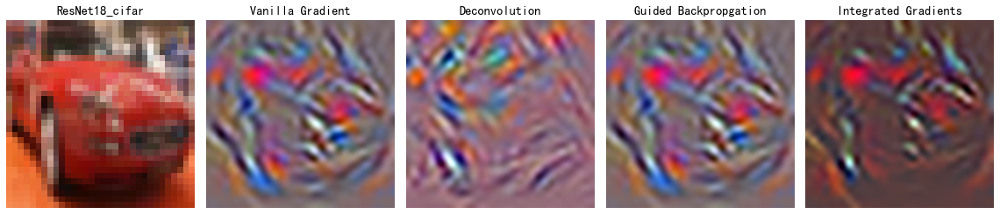

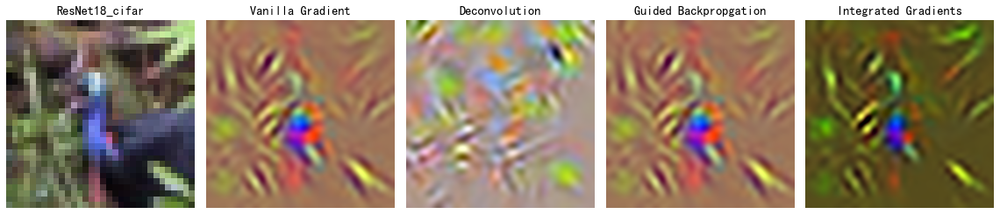

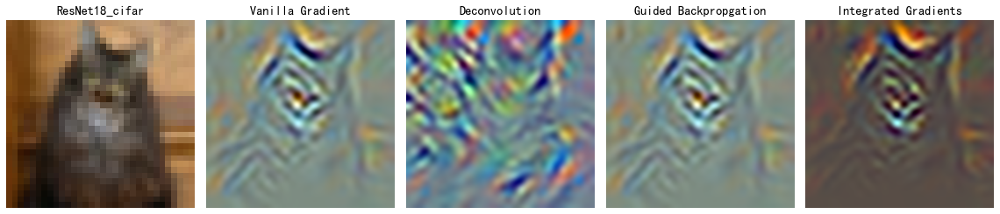

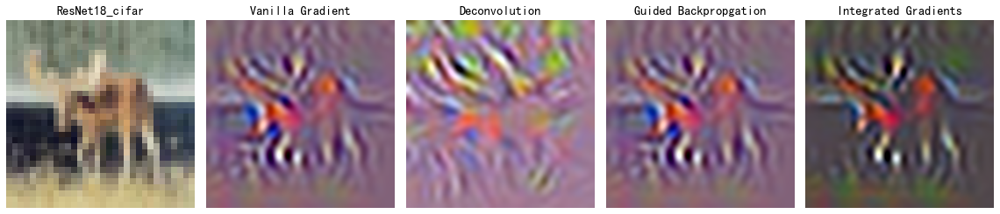

In [8]:
model_name_list = ['AlexNet_cifar','VGG11_cifar','ResNet18_cifar']
for i in range(3):
    model = load_pretrained_model(model_name_list[i].lower())
    for j in range(5):
        img = cifar_samples[j].cuda()
        visualize_imagenet(model, img, title=model_name_list[i], norm=True, clip=False)
        torch.cuda.empty_cache()
        time.sleep(3)

# MNIST可视化

In [9]:
train_data = torchvision.datasets.MNIST(
    root="./datasets",#路径
    train=True,#训练集
    download=False,#是否下载
    transform=transforms.ToTensor()#数据预处理
)
train_dataloader = DataLoader(train_data, batch_size=1, shuffle=False)
mnist_samples = {}
count = 0
for i, j in train_dataloader:
    if j not in mnist_samples.keys():
        mnist_samples[j.item()] = i
        count += 1
    if len(mnist_samples)==10:
        break

Load  AlexNet_mnist
Load  VGG11_mnist
Load  ResNet18_mnist


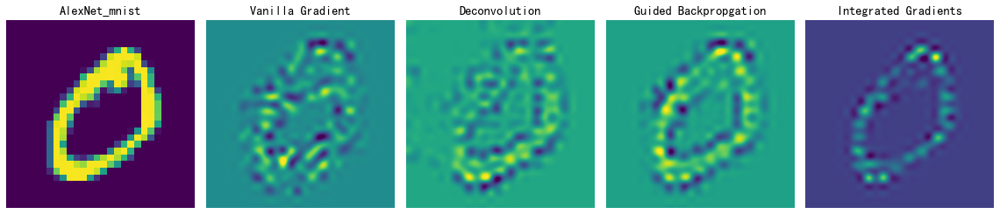

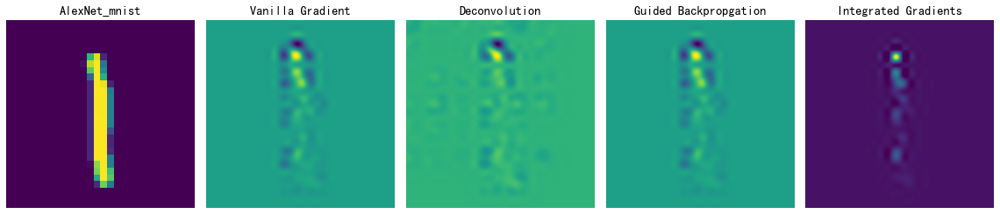

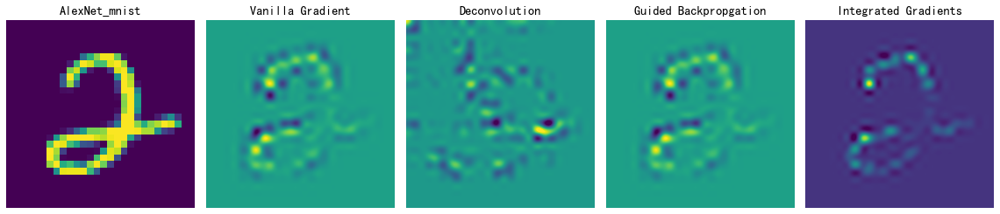

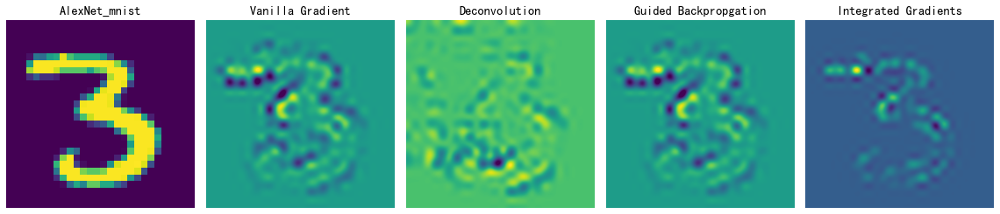

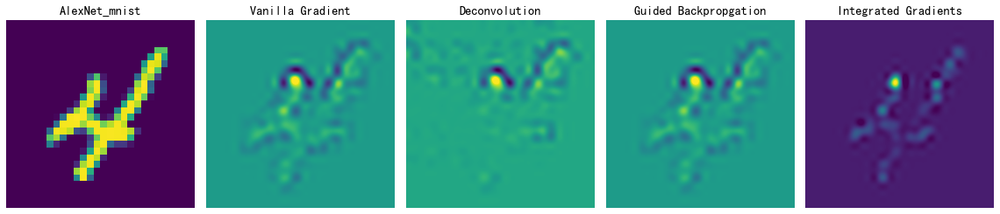

...

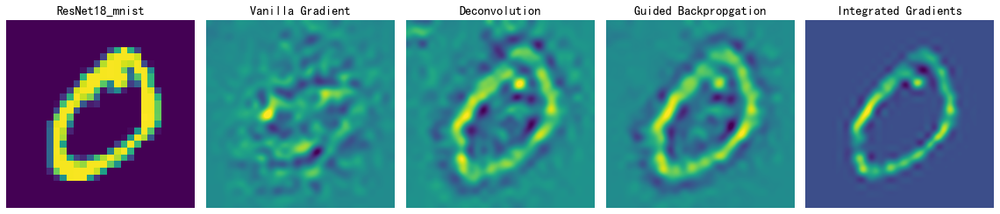

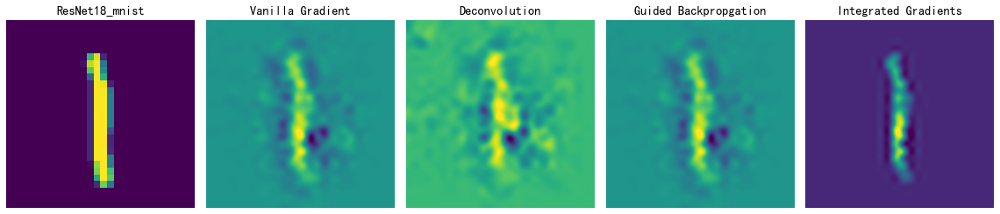

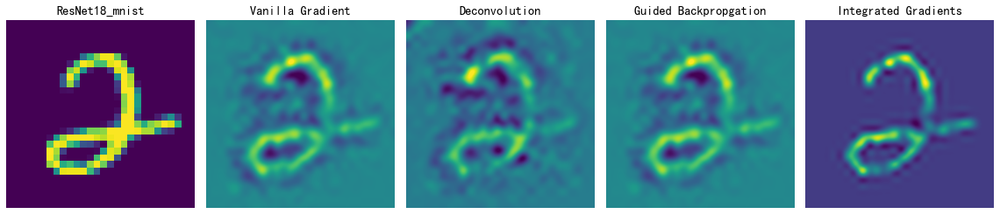

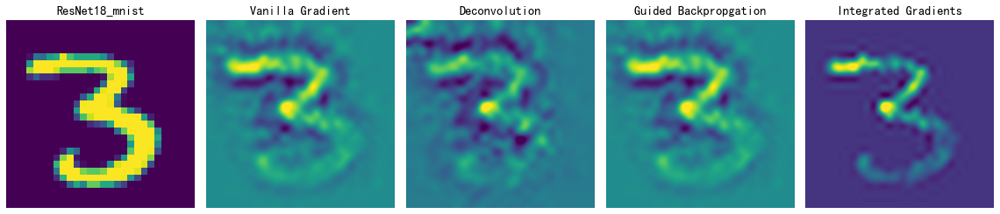

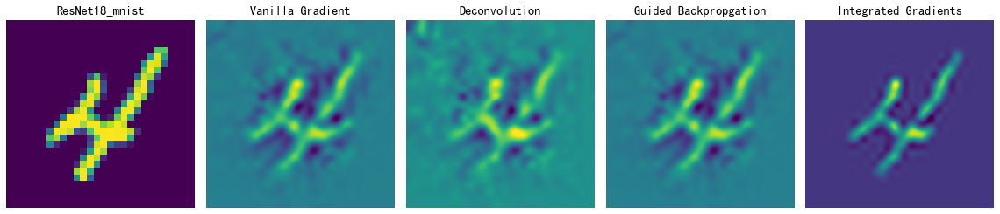

In [10]:
model_name_list = ['AlexNet_mnist','VGG11_mnist','ResNet18_mnist']
for i in range(3):
    model = load_pretrained_model(model_name_list[i].lower())
    for j in range(5):
        img = mnist_samples[j].cuda()
        visualize_imagenet(model, img, title=model_name_list[i], norm=True, clip=False, transpose=True)
        torch.cuda.empty_cache()
        time.sleep(3)